<h1>Melodia in Python: A Tutorial</h1>

This tutorial shows how to use the [Melodia Melody Extraction vamp plugin](http://mtg.upf.edu/technologies/melodia) directly in python.

* The tutorial assumes working knowledge of python (and that python is already installed on your system). 
* If you already have the [Melodia vamp plugin](http://mtg.upf.edu/technologies/melodia) installed, skip to step 2. 
* If you already have the [python vamp module](https://pypi.python.org/pypi/vamp) installed, skip to step 3.</p>

For further details about the Melodia algorithm itself please see:

J. Salamon and E. Gómez, "[Melody Extraction from Polyphonic Music Signals using Pitch Contour Characteristics](http://www.justinsalamon.com/uploads/4/3/9/4/4394963/salamongomezmelodytaslp2012.pdf)", IEEE Transactions on Audio, Speech and Language Processing, 20(6):1759-1770, Aug. 2012. ([copyright notice](http://www.justinsalamon.com/publications.html#IEEE_copyright))

Created by [Justin Salamon](http://www.justinsalamon.com), January 2016.

<h2>Step 1: Install Melodia</h2>

Go to the [Melodia website](http://mtg.upf.edu/technologies/melodia), follow the link to the download page, and download the plugin. Then follow the instructions provided in the README file to install the plugin on your system.

**Tip:** and easy way to check if the plugin is installed correctly is to open [Sonic Visualiser](http://www.sonicvisualiser.org/) and then check if the plugin appears in the menu under Transform > Analysis by Category > Pitch > MELODIA - Melody Extraction...

<h2>Step 2: Install the vamp python module</h2>

```>pip install vamp```

**Tip:** if you're not already using pip to manage your python packages: https://pip.pypa.io/en/stable/

<h2>Step 3: Using Melodia in python</h2>

<h3>3.1 Necessary modules</h3>

We need to load the ```vamp``` module of course. Since the module doesn't handle audio loading, we also need something to do that. There are many ways to load audio into python, I normally use either [Essentia](http://essentia.upf.edu/) or [Librosa](https://bmcfee.github.io/librosa/). If you don't have neither installed, Librosa is probably easier to set up (```pip install librosa```). Finally, we'll use ```matplotlib``` for visualizing the extracted melody pitch contour.

In [1]:
import vamp
import librosa
import essentia.standard as es
import matplotlib.pyplot as plt
%matplotlib inline
from __future__ import print_function

/Library/Python/2.7/site-packages/librosa/core/audio.py:37: UserWarning: Could not import scikits.samplerate. Falling back to scipy.signal
  warnings.warn('Could not import scikits.samplerate. '


<h3>3.2 Loading audio</h3>

In [54]:
# This is the audio file we'll be analyzing. 
# You can download it here: http://labrosa.ee.columbia.edu/projects/melody/mirex05TrainFiles.zip
audio_file = '/Users/nao/git/2045_project/song_data/B/audios/A006_B_1.wav'
audio_file = "/Users/nao/Desktop/lovelyday.mp3"

In [55]:
import IPython
IPython.display.Audio(audio_file)

In [56]:
# This is how we load audio using Essentia
loader = es.MonoLoader(filename=audio_file, downmix = 'mix', sampleRate = 44100)
audio = loader()

In [34]:
# This is how we load audio using Librosa
audio, sr = librosa.load(audio_file, sr=44100, mono=True)

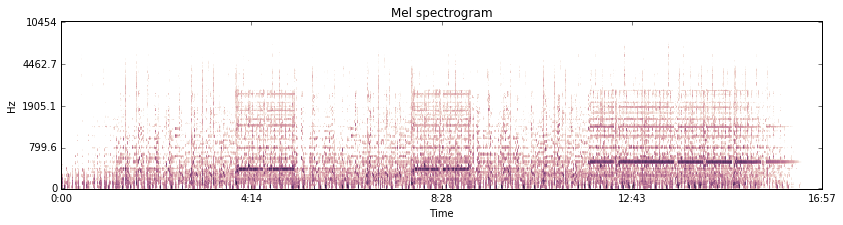

In [57]:
import numpy as np
# Mel spec / Constant Q
melspec = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels =128, hop_length=256) # shape (302, 64)

# plot
plt.figure(figsize=(30, 3)) 
plt.subplot(1,2,1)
librosa.display.specshow(librosa.logamplitude(melspec**2, ref_power=np.max),y_axis='mel', x_axis='time')
plt.title('Mel spectrogram')

<h3>3.3 Exracting the melody using Melodia with default parameter values</h3>

In [58]:
data = vamp.collect(audio, sr, "mtg-melodia:melodia")

In [59]:
# data is a dictionary containing one item called "vector"
data

{'vector': ( 0.002902494,
  array([-110., -110., -110., ...,    0.,    0.,    0.], dtype=float32))}

In [60]:
# vector is a tuple of two values: the hop size used for analysis and the array of pitch values
# Note that the hop size is *always* equal to 128/44100.0 = 2.9 ms
hop, melody = data['vector']
print(hop)
print(melody)

 0.002902494
[-110. -110. -110. ...,    0.    0.    0.]


<h3>\*\*\* SUPER IMPORTANT SUPER IMPORTANT \*\*\*</h3>
For reasons internal to the vamp architecture, THE TIMESTAMP OF THE FIRST VALUE IN THE MELODY ARRAY IS ALWAYS:

```
first_timestamp = 8 * hop = 8 * 128/44100.0 = 0.023219954648526078
```

This means that the timestamp of the pitch value at index i (starting with i=0) is given by:

```
timestamp[i] = 8 * 128/44100.0 + i * (128/44100.0)
```

So, if you want to generate a timestamp array to match the pitch values, you do it like this:

In [61]:
import numpy as np
timestamps = 8 * 128/44100.0 + np.arange(len(melody)) * (128/44100.0)

As noted above, the hop size used in Melodia is always 2.9 ms, regardless of the sampling rate of the audio being analysed (though a rate of 44100 is recommended for optimal performance). This in turn means the first timestamp is always 23.2 ms, again, regardless of the sampling rate.

<h3>3.4 Extracting the melody using Melodia with custom parameter values</h3>

In [62]:
# parameter values are specified by providing a dicionary to the optional "parameters" parameter:
params = {"minfqr": 100.0, "maxfqr": 800.0, "voicing": 0.2, "minpeaksalience": 0.0}

data = vamp.collect(audio, sr, "mtg-melodia:melodia", parameters=params)
hop, melody = data['vector']

Melodia has 4 parameters:
* **minfqr**: minimum frequency in Hertz (default 55.0)
* **maxfqr**: maximum frequency in Hertz (default 1760.0)
* **voicing**: voicing tolerance. Greater values will result in more pitch contours included in the final melody. Smaller values will result in less pitch contours included in the final melody (default 0.2).
* **minpeaksalience**: (in Sonic Visualiser "Monophonic Noise Filter") is a hack to avoid silence turning into junk contours when analyzing monophonic recordings (e.g. solo voice with no accompaniment). Generally you want to leave this untouched (default 0.0).

<h3>3.4 Plot the extracted melody</h3>

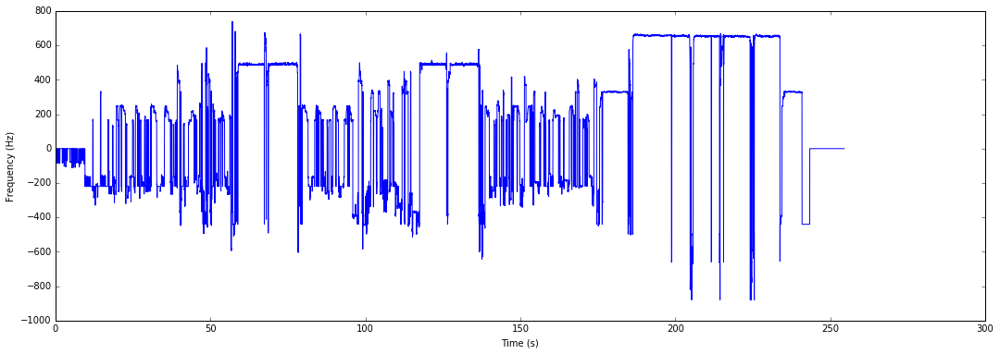

In [63]:
# Melodia returns unvoiced (=no melody) sections as negative values. So by default, we get:
plt.figure(figsize=(18,6))
plt.plot(timestamps, melody)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.show()

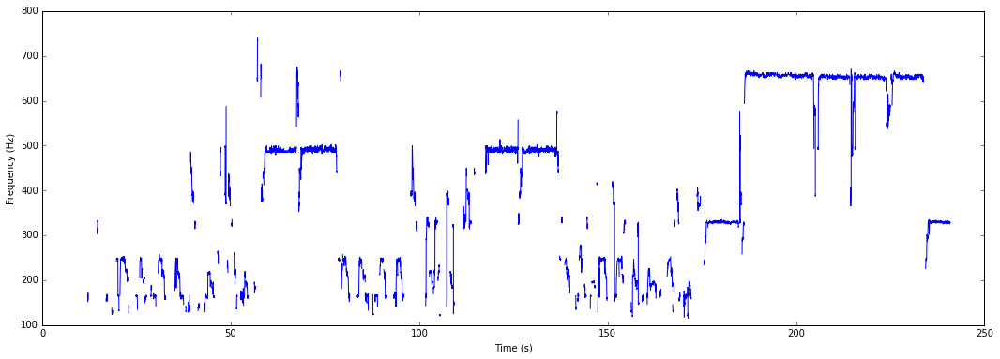

In [64]:
# A clearer option is to get rid of the negative values before plotting
melody_pos = melody[:]
melody_pos[melody<=0] = None
plt.figure(figsize=(18,6))
plt.plot(timestamps, melody_pos)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.show()

/Library/Python/2.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in less_equal


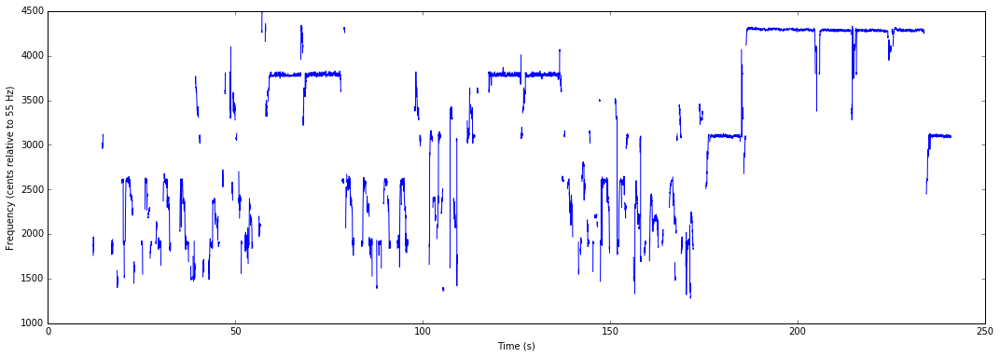

In [65]:
# Finally, you might want to plot the pitch sequence in cents rather than in Hz. 
# This especially makes sense if you are comparing two or more pitch sequences 
# to each other (e.g. comparing an estimate against a reference).
melody_cents = 1200*np.log2(melody/55.0)
melody_cents[melody<=0] = None
plt.figure(figsize=(18,6))
plt.plot(timestamps, melody_cents)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (cents relative to 55 Hz)')
plt.show()

/Library/Python/2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in less_equal
  app.launch_new_instance()


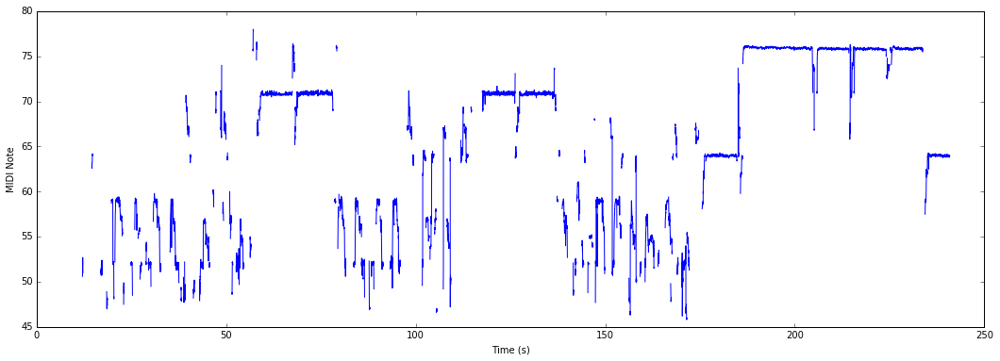

In [66]:
# To MIDI
melody_pos = melody[:]
melody_pos[melody<=0] = None
midi_pos = librosa.hz_to_midi(melody_pos)

plt.figure(figsize=(18,6))
plt.plot(timestamps, midi_pos)
plt.xlabel('Time (s)')
plt.ylabel('MIDI Note')
plt.show()

## Beat detection  

Quantizing melody based on the position of notes.  
Beat detection is done by Adam Stark's amazing BTrack: https://github.com/adamstark/BTrack 

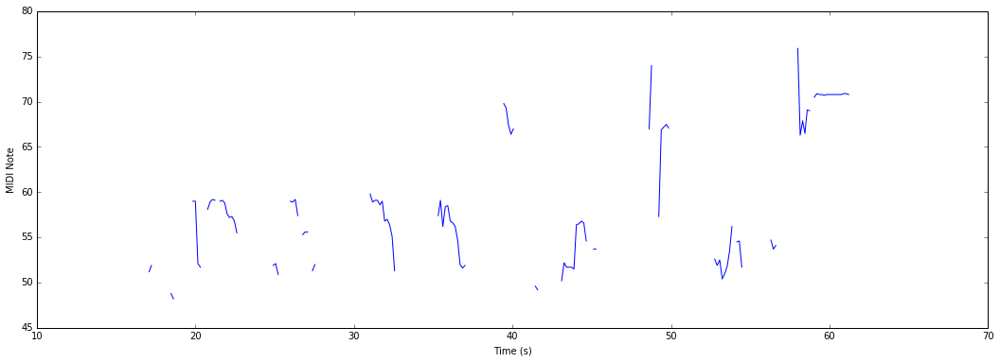

In [71]:
import btrack

# extract beats location
beats = btrack.trackBeats(audio)    

resolution = 4 # 1/resolution beat = 16th note

# approximate position of 16th note
note_timestamps = []
midi_notes = []
for i, beat in enumerate(beats[:-2]):
    nextbeat = beats[i + 1]
    note16 = (nextbeat - beat)/float(resolution)
    for j in range(resolution):
        time = beat + j * note16
        note_timestamps.append(time)
        
        # find the closesest timestamp
        idx = (np.abs(timestamps-time)).argmin()
        midi_note = midi_pos[idx]
        midi_notes.append(midi_note) # store midi note at the timestamp

plt.figure(figsize=(18,6))
plt.plot(note_timestamps[:400], midi_notes[:400])
plt.xlabel('Time (s)')
plt.ylabel('MIDI Note')
plt.show()

## Playback MIDI

Using Abjad and TiMidity

Abjad https://github.com/Abjad/abjad  
`$ pip install abjad`

LilyPond http://lilypond.org/  

TiMidity http://timidity.sourceforge.net/  
`brew install timidity` (on Mac) 

In [76]:
import math
from abjad import *
%load_ext abjad.ext.ipython

def get_score(seq): # TODO: bpm comtrol
    # all notes / rests
    midi_notes = []
    
    prev_notes = 0 # previous note
    duration_count = 1 # 1/16th 
    for index, notes in enumerate(seq):
        if math.isnan(notes) is False:
            if int(prev_notes) == int(notes):
                duration_count += 1
            else:
                duration = Duration(min(4, duration_count), 16)
                new_notes = Chord([int(notes - 60)], duration)
    #            new_notes = Chord([ n for n in notes if n > 0], duration)
                midi_notes.append(new_notes)
                duration_count = 1
            prev_notes = notes
        
        # rest note
        else:
            duration = Duration(1, 16)
            midi_notes.append(Rest(duration))

    staff = Staff(midi_notes)
    return staff

#    print generated
staff = get_score(midi_notes)
#show(staff)
play(staff)

The abjad.ext.ipython extension is already loaded. To reload it, use:
  %reload_ext abjad.ext.ipython


<audio controls type="audio/ogg" src="data:audio/ogg;base64,T2dnUwACAAAAAAAAAAC14Zt7AAAAAFqS+JkBHgF2b3JiaXMAAAAAAkSsAAD/////APQBAP////+4AU9nZ1MAAIAAAAAAAAAAteGbewEAAAA/ad2nFIv/////////////////////PDg6A3ZvcmJpcywAAABYaXBoLk9yZyBsaWJWb3JiaXMgSSAyMDE1MDEwNSAo4puE4puE4puE4puEKQEAAABLAAAATE9DQVRJT049L3Zhci9mb2xkZXJzL3MwLzRzd2YwbDgxMTR4YzZjaHBuX3MyX25zYzAwMDBncS9UL3RtcG1hQnlpMy9vdXQub2dnAQV2b3JiaXMpQkNWAQAIAACAIkwYxIDQkFUAABAAAKCsN5Z7yL333nuBqEcUe4i9995746xH0HqIuffee+69pxp7y7333nMgNGQVAAAEAIApCJpy4ELqvfceGeYRURoqx733HhmFiTCUGYU9ldpa6yGT3ELqPeceCA1ZBQAAAgBACCGEFFJIIYUUUkghhRRSSCmlmGKKKaaYYsoppxxzzDHHIIMOOuikk1BCCSmkUEoqqaSUUkot1lpz7r0H3XPvQfgghBBCCCGEEEIIIYQQQghCQ1YBACAAAARCCCFkEEIIIYQUUkghpphiyimngNCQVQAAIACAAAAAAEmRFMuxHM3RHM3xHM8RJVESJdEyLdNSNVMzPVVURdVUVVdVXV13bdV2bdWWbddWbdV2bdVWbVm2bdu2bdu2bdu2bdu2bdu2bSA0ZBUAIAEAoCM5kiMpkiIpkuM4kgSEhqwCAGQAAAQAoCiK4ziO5EiOJWmSZnmWZ4maqJma6KmeCoSGrAIAAAEABAAAAAAA4HiK53iOZ3mS53iOZ3map2mapmmapmmapmmapmmapmmapmmapmmapmmapmmapmmapmmapmmapmmapmlAaMgqAEACAEDHcRzHcRzHcRxHciQHCA1ZBQDIAAAIAEBSJMdyLEdzNMdzPEd0RMd0TMmUVMm1XAsIDVkFAAACAAgAAAAAAEATLEVTPMeTPM8TNc/TNM0TTVE0TdM0TdM0TdM0TdM0TdM0TdM0TdM0TdM0TdM0TdM0TdM0TdM0TVMUgdCQVQAABAAAIZ1mlmqACDOQYSA0ZBUAgAAAABihCEMMCA1ZBQAABAAAiKHkIJrQmvPNOQ6a5aCpFJvTwYlUmye5qZibc84555xszhnjnHPOKcqZxaCZ0JpzzkkMmqWgmdCac855EpsHranSmnPOGeecDsYZYZxzzmnSmgep2Vibc85Z0JrmqLkUm3POiZSbJ7W5VJtzzjnnnHPOOeecc86pXpzOwTnhnHPOidqba7kJXZxzzvlknO7NCeGcc84555xzzjnnnHPOCUJDVgEAQAAABGHYGMadgiB9jgZiFCGmIZMedI8Ok6AxyCmkHo2ORkqpg1BSGSeldILQkFUAACAAAIQQUkghhRRSSCGFFFJIIYYYYoghp5xyCiqopJKKKsoos8wyyyyzzDLLrMPOOuuwwxBDDDG00kosNdVWY4215p5zrjlIa6W11lorpZRSSimlIDRkFQAAAgBAIGSQQQYZhRRSSCGGmHLKKaegggoIDVkFAAACAAgAAADwJM8RHdERHdERHdERHdERHc/xHFESJVESJdEyLVMzPVVUVVd2bVmXddu3hV3Ydd/Xfd/XjV8XhmVZlmVZlmVZlmVZlmVZlmUJQkNWAQAgAAAAQgghhBRSSCGFlGKMMcecg05CCYHQkFUAACAAgAAAAABHcRTHkRzJkSRLsiRN0izN8jRP8zTRE0VRNE1TFV3RFXXTFmVTNl3TNWXTVWXVdmXZtmVbt31Ztn3f933f933f933f933f13UgNGQVACABAKAjOZIiKZIiOY7jSJIEhIasAgBkAAAEAKAojuI4jiNJkiRZkiZ5lmeJmqmZnumpogqEhqwCAAABAAQAAAAAAKBoiqeYiqeIiueIjiiJlmmJmqq5omzKruu6ruu6ruu6ruu6ruu6ruu6ruu6ruu6ruu6ruu6ruu6ruu6QGjIKgBAAgBAR3IkR3IkRVIkRXIkBwgNWQUAyAAACADAMRxDUiTHsixN8zRP8zTREz3RMz1VdEUXCA1ZBQAAAgAIAAAAAADAkAxLsRzN0SRRUi3VUjXVUi1VVD1VVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVXVNE3TNIHQkJUAABkAAMO05NJyz42gSCpHtdaSUeUkxRwaiqCCVnMNFTSISYshYgohJjGWDjqmnNQaUykZc1RzbCFUiEkNOqZSKQYtCEJDVggAoRkADscBJMsCJEsDAAAAAAAAAEnTAM3zAMvzAAAAAAAAAEDSNMDyNEDzPAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAJE0DNM8DNM8DAAAAAAAAAM3zAE8UAU8UAQAAAAAAAMDyPMATPcATRQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHE0DNM8DNM8DAAAAAAAAAMvzAE8UAc8TAQAAAAAAAEDzPMATRcATRQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAEOAAABFkKhISsCgDgBAIckQZIgSdA0gGRZ0DRoGkwTIFkWNA2aBtMEAAAAAAAAAAAAQPI0aBo0DaIIkDQPmgZNgygCAAAAAAAAAAAAIGkaNA2aBlEESJoGTYOmQRQBAAAAAAAAAAAA0EwToghRhGkCPNOEKEIUYZoAAAAAAAAAAAAAAAAAAAAAAAAAAAAAgAAAgAEHAIAAE8pAoSErAoA4AQCHolgWAAA4kmNZAADgOJJlAQCAZVmiCAAAlqWJIgAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACAAACAAQcAgAATykChISsBgCgAAIeiWBZwHMsCjmNZQJIsC2BZAM0DaBpAFAGAAACAAgcAgAAbNCUWByg0ZCUAEAUA4FAUy9I0UeQ4lqVposiRLEvTRJFlaZrnmSY0

<h2>That's all folks</h2>

For further information feel free to contact me: justin.salamon@nyu.edu (or justin.salamon@gmail.com)